In [ ]:
# !pip install split-folders

In [ ]:
# import splitfolders
# splitfolders.ratio("D:\\Stroke Data", output="D:\\Stroke Data_Splitted\\",seed=1337, ratio=(.7, .3), group_prefix=None, move=False)

In [11]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix
import seaborn as sn; sn.set(font_scale=1.4)
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import cv2
import tensorflow as tf
from tqdm import tqdm
#import mediapipe as mp
import time
import os
from glob import glob

from collections import Counter
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler, LabelEncoder

#mpPose = mp.solutions.pose
#pose = mpPose.Pose()
#mpDraw = mp.solutions.drawing_utils # For drawing keypoints
#points = mpPose.PoseLandmark # Landmarks
data = []
a=0

In [12]:
# Import necessary libraries
import pandas as pd
import warnings
from google.colab import drive

# Suppress warnings
warnings.filterwarnings('ignore')

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your CSV files in Google Drive
# Make sure to provide the correct file paths. You can find these paths by navigating
# to the file in your Google Drive, right-clicking, and selecting "Get link."
# Replace 'YourFolder' with the appropriate folder name if your files are inside a folder.
base_path = '/content/drive/My Drive/ColabNotebooks/Cricket_Enhancement/Drive/'  # Adjust as needed


# Load your datasets
Straight_Drive_df = pd.read_csv(base_path + "Straight_Drive.csv")
Sweep_df = pd.read_csv(base_path + "Sweep.csv")
Pull_df = pd.read_csv(base_path + "Pull.csv")
onDrive_df = pd.read_csv(base_path + "onDrive.csv")
Flick_df = pd.read_csv(base_path + "Flick.csv")
Cut_df = pd.read_csv(base_path + "Cut.csv")
Cover_Drive_df = pd.read_csv(base_path + "Cover_Drive.csv")
#Cover_Drive_df = pd.read_csv(base_path + "Cover_Drive_.csv")
back_foot_punch_df = pd.read_csv(base_path + "back_foot_punch.csv")

# Now you can work with your DataFrames
print(Cover_Drive_df.head())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   Unnamed: 0      F0_x      F0_y      F0_z    F0_vis      F1_x      F1_y  \
0         850  0.605604  0.319193 -0.206423  0.998100  0.608060  0.310672   
1         851  0.605210  0.320216 -0.195480  0.998275  0.607313  0.310882   
2         852  0.605156  0.321100 -0.198475  0.998430  0.607107  0.311066   
3         853  0.602378  0.320967 -0.149304  0.998564  0.604508  0.311048   
4         854  0.600436  0.320933 -0.092031  0.998703  0.602337  0.311165   

       F1_z    F1_vis      F2_x  ...   F30_vis     F31_x     F31_y     F31_z  \
0 -0.205325  0.997993  0.609513  ...  0.704735  0.636576  0.643802 -0.210230   
1 -0.193891  0.998183  0.608708  ...  0.693936  0.637445  0.648802 -0.216752   
2 -0.197096  0.998352  0.608519  ...  0.685689  0.637536  0.646330 -0.215665   
3 -0.147209  0.998500  0.605890  ...  0.679551  0.637206  0.644141 -0.173419   
4 -0.096

In [ ]:
'''
Straight_Drive_df=pd.read_csv("Straight_Drive.csv")
Sweep_df=pd.read_csv("Sweep.csv")
Pull_df=pd.read_csv("Pull.csv")
onDrive_df=pd.read_csv("onDrive.csv")
Flick_df=pd.read_csv("Flick.csv")
Cut_df=pd.read_csv("Cut.csv")
Cover_Drive_df=pd.read_csv("Cover_Drive.csv")
back_foot_punch_df=pd.read_csv("back_foot_punch.csv")
'''

In [13]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error

# Load the dataset (replace 'Cover_Drive.csv' with your actual dataset file)
Posdataset = Cover_Drive_df #pd.read_csv('Cover_Drive.csv')
#Posdataset= Posdataset.drop(columns=['Unnamed: 0', 'Label'], axis=1)
# Extract relevant columns (F1_x, F1_y)
#print(Posdataset[['F2_y']].values)

In [14]:
data = Posdataset[['F1_x', 'F1_y']].values

In [6]:
# Normalize the data
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Prepare the data for LSTM (create sequences)
def create_sequences(data, sequence_length):
    xs, ys = [], []
    for i in range(len(data) - sequence_length - 1):
        x = data[i:i+sequence_length]
        y = data[i+sequence_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

# Define a smaller sequence length (e.g., 5 previous frames to predict the next one)
sequence_length = 5

# Split the data into sequences
X, y = create_sequences(data_scaled, sequence_length)

# Adjust the train/test split (e.g., use the first 800 rows for training)
train_size = 800  # You can adjust this based on the size of your dataset
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# Print to debug shape of data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Ensure there are sequences in the test set
if X_test.shape[0] == 0:
    raise ValueError("Test set (X_test) is empty. Adjust the data split or sequence length.")

# Build the LSTM model
model = Sequential()
model.add(LSTM(64, activation='relu', return_sequences=True, input_shape=(sequence_length, 2)))
model.add(LSTM(64, activation='relu'))
model.add(Dense(2))  # Predicting two values: F1_x and F1_y

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)

# Predict the next frames
predictions_scaled = model.predict(X_test)

# Inverse transform the predictions to original scale
predictions = scaler.inverse_transform(predictions_scaled)

# Evaluate performance using Mean Absolute Error
actual = data[train_size:train_size+len(predictions)]  # Adjust actual frames for MAE calculation
mae = mean_absolute_error(actual, predictions)
print(f'Mean Absolute Error: {mae}')

# Compare predictions with actual data
print('Predicted:', predictions)
print('Actual:', actual)


X_train shape: (800, 5, 2), y_train shape: (800, 2)
X_test shape: (37, 5, 2), y_test shape: (37, 2)
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step
Mean Absolute Error: 0.006280025954313329
Predicted: [[0.38652107 0.4220122 ]
 [0.38231403 0.42353275]
 [0.38096026 0.42257985]
 [0.38030338 0.42106587]
 [0.38012135 0.41835245]
 [0.3808991  0.41341963]
 [0.3840693  0.40563065]
 [0.3840865  0.4021868 ]
 [0.38429224 0.39978167]
 [0.38422662 0.3975201 ]
 [0.38397458 0.39611667]
 [0.3831916  0.39588585]
 [0.3819364  0.39620182]
 [0.38114905 0.3963558 ]
 [0.38055542 0.3965059 ]
 [0.37931988 0.39727455]
 [0.3779925  0.39900783]
 [0.37730196 0.39975563]
 [0.3762214  0.40004086]
 [0.37592873 0.3997917 ]
 [0.37616545 0.39938465]
 [0.37631905 0.3991166 ]
 [0.3752021  0.40076965]
 [0.37472105 0.40259475]
 [0.37393087 0.40480587]
 [0.37302077 0.40717262]
 [0.3721464  0.40892   ]
 [0.3713977  0.41030988]
 [0.37210476 0.41020405]
 [0.37270334 0.40985313]
 [0.37193355 0.41127953]
 [0.37188768 0.4119178 ]
 [0.3721

X_train shape: (800, 5, 132), y_train shape: (800, 3, 132)
X_test shape: (35, 5, 132), y_test shape: (35, 3, 132)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
Mean Absolute Error for next 3 frames: 0.044750820051420725


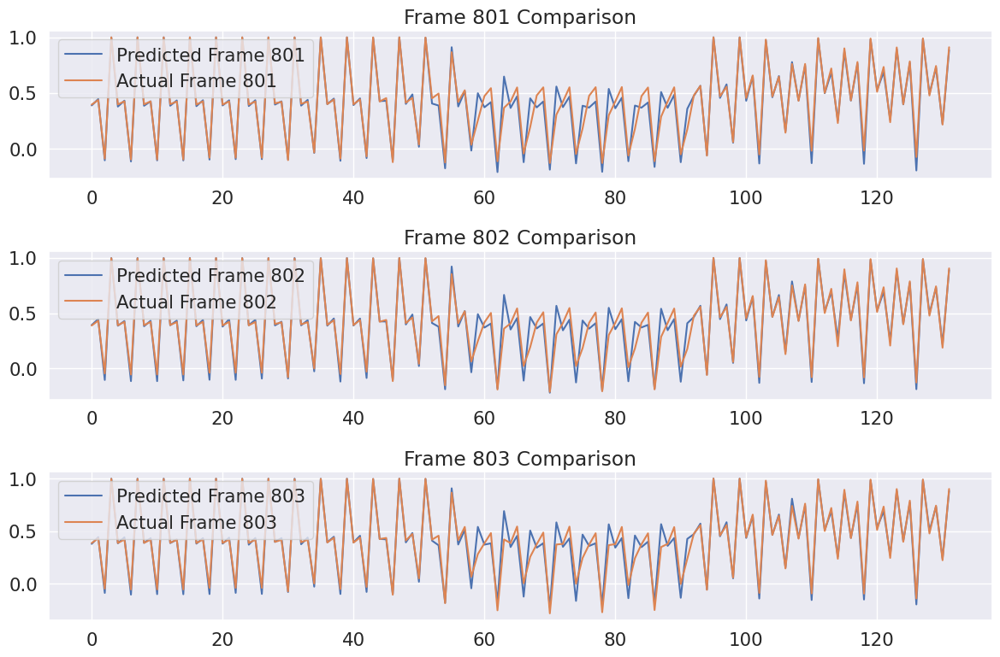

In [15]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt

# Load the dataset (replace 'Cover_Drive.csv' with your actual dataset file)
Posdataset =  Cover_Drive_df #pd.read_csv('Cover_Drive.csv')

# Extract all PoseNet columns (assuming columns are named as in your example)
columns = ['F{}_{}'.format(i, axis) for i in range(33) for axis in ['x', 'y', 'z', 'vis']]
data = Posdataset[columns].values

# Normalize the data
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Prepare the data for LSTM (create sequences)
def create_sequences(data, sequence_length):
    xs, ys = [], []
    for i in range(len(data) - sequence_length - 3):  # We want to predict next 3 frames
        x = data[i:i+sequence_length]
        y = data[i+sequence_length:i+sequence_length+3]  # Predict 3 future frames
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

# Define a smaller sequence length (e.g., use 5 previous frames to predict the next 3 frames)
sequence_length = 5

# Create sequences with the new sequence length
X, y = create_sequences(data_scaled, sequence_length)

# Adjust the train/test split (e.g., 800 rows for training)
train_size = 800  # Adjust based on the number of frames you have

X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# Print to check the shape of the data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Ensure there are sequences in the test set
if X_test.shape[0] == 0:
    raise ValueError("Test set (X_test) is empty. Adjust the data split or sequence length.")


from tensorflow.keras.layers import Reshape

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(sequence_length, data.shape[1])))
model.add(LSTM(128, activation='relu'))
model.add(Dense(3 * data.shape[1]))  # Predicting 3 frames (3 * 132 features)
model.add(Reshape((3, data.shape[1])))  # Reshape output to (3, 132)


# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model

model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=0)


# Predict the next 3 frames
predictions_scaled = model.predict(X_test[:1])  # Predict only the first set of test data (next 3 frames)

# Inverse transform the predictions to the original scale
predictions = scaler.inverse_transform(predictions_scaled.reshape(3, -1))

# Get the actual next 3 frames (841, 842, 843)
actual = data[train_size:train_size+3]

# Evaluate performance using Mean Absolute Error (MAE)
mae = mean_absolute_error(actual, predictions)
print(f'Mean Absolute Error for next 3 frames: {mae}')


# Compare predictions with actual data visually
plt.figure(figsize=(12, 8))

for i in range(3):  # For each of the 3 predicted frames
    plt.subplot(3, 1, i+1)
    plt.plot(predictions[i], label='Predicted Frame {}'.format(train_size + i + 1))
    plt.plot(actual[i], label='Actual Frame {}'.format(train_size + i + 1))
    plt.legend()
    plt.title(f'Frame {train_size + i + 1} Comparison')

plt.tight_layout()
plt.show()


**The END**

In [9]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

columns_list = dataset.columns.tolist()

preframes = predictions_rescaled

# Reshape frames to 2D (if it is a 3D array)
preframes = preframes.reshape(1, 132)

# Now create the DataFrame
PredictedFrame = pd.DataFrame(preframes, columns=columns_list)

orgframes = y_test_rescaled
orgframes = orgframes.reshape(1, 132)
OrignalFrame = pd.DataFrame(orgframes, columns=columns_list)


NameError: name 'dataset' is not defined

In [8]:
dfA0= actual[0]
dfA1= actual[1]
dfA2= actual[2]

dfP0= predictions[0]
dfP1= predictions[1]
dfP2= predictions[2]
# Load DataFrame with 33 joints (columns: 'x', 'y', 'z', 'visibility')
df1 = PredictedFrame  # Replace with your actual data
df2 = OrignalFrame  # Replace with your actual data

def extract_coordinates(df):
    joints = 33  # Number of joints
    x, y, z = [], [], []

    for i in range(joints):
        x.append(df[f'F{i}_x'].values[0])  # Take the first row's x value
        y.append(df[f'F{i}_y'].values[0])  # Take the first row's y value
        z.append(df[f'F{i}_z'].values[0])  # Take the first row's z value

    return np.array(x), np.array(y), np.array(z)

# Extract coordinates for both poses
x1, y1, z1 = extract_coordinates(df1)
x2, y2, z2 = extract_coordinates(df2)

# Define connections between joints based on MediaPipe PoseNet model
POSE_CONNECTIONS = [
    (0, 1), (1, 2), (2, 3), (3, 7),  # Right arm
    (0, 4), (4, 5), (5, 6), (6, 8),  # Left arm
    (9, 10), (11, 12),               # Shoulders
    (11, 13), (13, 15), (15, 17),    # Left leg
    (12, 14), (14, 16), (16, 18),    # Right leg
    (11, 23), (12, 24),              # Hips to shoulders
    (23, 24), (23, 25), (24, 26),    # Hips and upper legs
    (25, 27), (27, 29), (29, 31),    # Left lower leg
    (26, 28), (28, 30), (30, 32)     # Right lower leg
]

# Function to plot the skeleton for a single pose in 3D
def plot_skeleton(x, y, z, connections, color='blue'):
    lines = []
    for joint1, joint2 in connections:
        lines.append(go.Scatter3d(
            x=[x[joint1], x[joint2]],
            y=[y[joint1], y[joint2]],
            z=[z[joint1], z[joint2]],
            mode='lines',
            line=dict(color=color, width=5)
        ))
    return lines

# Create the 3D plot with both poses
fig = go.Figure()

# Add skeleton for both poses (in red and blue)
fig.add_traces(plot_skeleton(x1, y1, z1, POSE_CONNECTIONS, color='red'))
fig.add_traces(plot_skeleton(x2, y2, z2, POSE_CONNECTIONS, color='blue'))

# Set the layout for the 3D plot with increased size
fig.update_layout(
    title='3D Pose Skeleton Visualization',
    scene=dict(
        xaxis=dict(title='X-axis'),
        yaxis=dict(title='Y-axis'),
        zaxis=dict(title='Z-axis', range=[-1, 1]),  # Adjust range as needed
        aspectmode='cube'
    ),
    width=1200,  # Increased width
    height=800,  # Increased height
    showlegend=False
)

# Display the plot
fig.show()


NameError: name 'PredictedFrame' is not defined

In [10]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
Posdataset = pd.read_csv('Cover_Drive.csv')
Posdataset= Posdataset.drop(columns=['Unnamed: 0', 'Label'], axis=1)
columns_list = Posdataset.columns.tolist() # dataset.columns.tolist()

print(columns_list)
preframes = predictions[0]
print(preframes)
print(preframes.shape)
# Reshape frames to 2D (if it is a 3D array)
preframes = preframes.reshape(1, 132)
print(preframes.shape)

FileNotFoundError: [Errno 2] No such file or directory: 'Cover_Drive_.csv'

In [ ]:
preframes0 = predictions[0]
preframes0 = preframes0.reshape(1, 132)
# Now create the DataFrame
PredictedFrame0 = pd.DataFrame(preframes0, columns=columns_list)

preframes1 = predictions[1]
preframes1 = preframes1.reshape(1, 132)
# Now create the DataFrame
PredictedFrame1 = pd.DataFrame(preframes1, columns=columns_list)

preframes2 = predictions[2]
preframes2 = preframes2.reshape(1, 132)
# Now create the DataFrame
PredictedFrame2 = pd.DataFrame(preframes2, columns=columns_list)

NameError: name 'columns_list' is not defined

In [ ]:

y_test_rescaled=actual[i]
orgframes = y_test_rescaled
orgframes = orgframes.reshape(1, 132)
OrignalFrame = pd.DataFrame(orgframes, columns=columns_list)


NameError: name 'columns_list' is not defined

In [ ]:
# Load DataFrame with 33 joints (columns: 'x', 'y', 'z', 'visibility')
dfo = OrignalFrame  # Replace with your actual data
df0 = PredictedFrame0  # Replace with your actual data
df1 = PredictedFrame1  # Replace with your actual data
df2 = PredictedFrame2  # Replace with your actual data

def extract_coordinates(df):
    joints = 33  # Number of joints
    x, y, z = [], [], []

    for i in range(joints):
        x.append(df[f'F{i}_x'].values[0])  # Take the first row's x value
        y.append(df[f'F{i}_y'].values[0])  # Take the first row's y value
        z.append(df[f'F{i}_z'].values[0])  # Take the first row's z value

    return np.array(x), np.array(y), np.array(z)

# Extract coordinates for both poses
x0, y0, z0 = extract_coordinates(df0)
x1, y1, z1 = extract_coordinates(df1)
x2, y2, z2 = extract_coordinates(df2)
xo, yo, zo = extract_coordinates(dfo)

NameError: name 'OrignalFrame' is not defined

In [ ]:
import plotly.graph_objs as go
import ipywidgets as widgets
from IPython.display import display

# Create your 3D plot as before
fig = go.Figure()

fig.add_traces(plot_skeleton(x0, y0, z0, POSE_CONNECTIONS, color='red'))
fig.add_traces(plot_skeleton(x1, y1, z1, POSE_CONNECTIONS, color='green'))
fig.add_traces(plot_skeleton(x2, y2, z2, POSE_CONNECTIONS, color='yellow'))
fig.add_traces(plot_skeleton(xo, yo, zo, POSE_CONNECTIONS, color='blue'))

fig.update_layout(
    title='3D Pose Skeleton Visualization',
    scene=dict(
        xaxis=dict(title='X-axis'),
        yaxis=dict(title='Y-axis'),
        zaxis=dict(title='Z-axis', range=[-1, 1]),
        aspectmode='cube',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))
    ),
    width=1200,
    height=800,
    showlegend=False
)

# Display the plot
fig.show()

# Button to display current camera settings
button = widgets.Button(description="Get Camera Values")

def on_button_click(b):
    # Extract current camera settings (manual interaction required)
    camera = fig.layout.scene.camera
    print("Current Camera Values:")
    print(f"x: {camera.eye.x}, y: {camera.eye.y}, z: {camera.eye.z}")

button.on_click(on_button_click)
display(button)


NameError: name 'plot_skeleton' is not defined

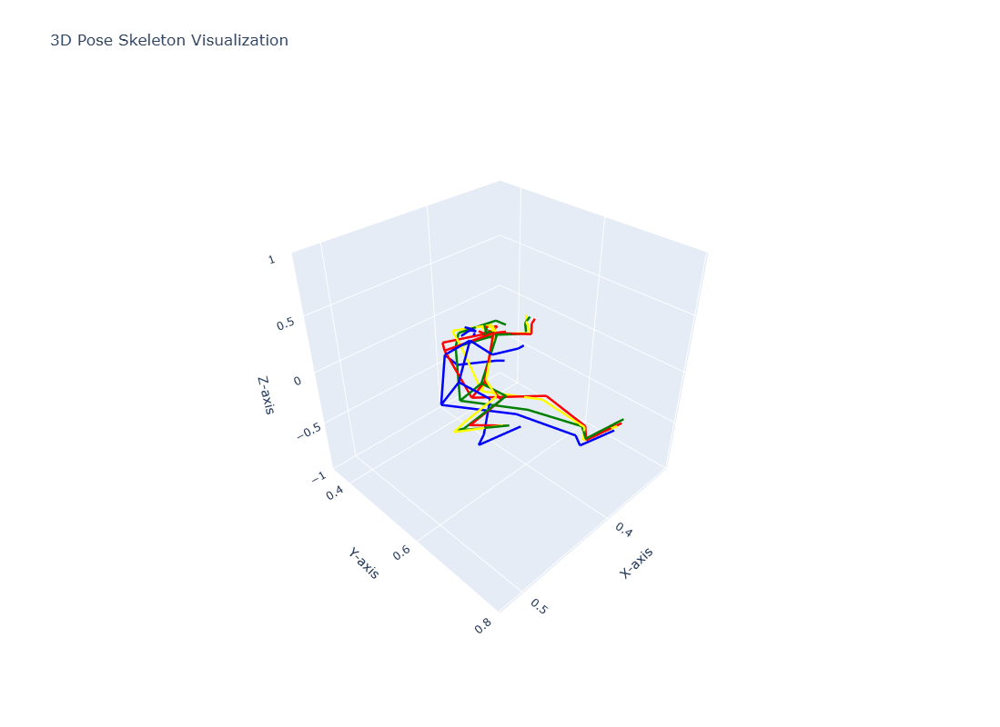

In [ ]:
# Create the 3D plot with both poses
fig = go.Figure()

# Add skeleton for both poses (in red, green, yellow, and blue)
fig.add_traces(plot_skeleton(x0, y0, z0, POSE_CONNECTIONS, color='red'))
fig.add_traces(plot_skeleton(x1, y1, z1, POSE_CONNECTIONS, color='green'))
fig.add_traces(plot_skeleton(x2, y2, z2, POSE_CONNECTIONS, color='yellow'))
fig.add_traces(plot_skeleton(xo, yo, zo, POSE_CONNECTIONS, color='blue'))

# Set the layout for the 3D plot with increased size and custom camera angle
fig.update_layout(
    title='3D Pose Skeleton Visualization',
    scene=dict(
        xaxis=dict(title='X-axis'),
        yaxis=dict(title='Y-axis'),
        zaxis=dict(title='Z-axis', range=[-1, 1]),  # Adjust range as needed
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)  # Set x, y, z to adjust the viewing angle
        )
    ),
    width=1200,  # Increased width
    height=800,  # Increased height
    showlegend=False
)

# Display the plot
fig.show()


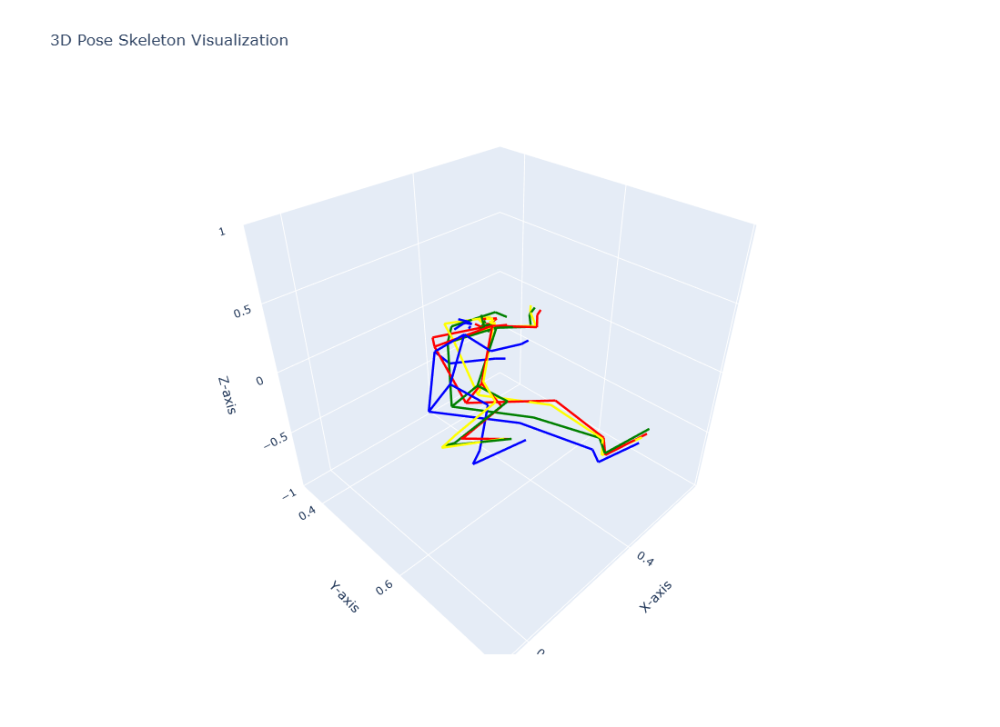

In [ ]:


# Define connections between joints based on MediaPipe PoseNet model
POSE_CONNECTIONS = [
    (0, 1), (1, 2), (2, 3), (3, 7),  # Right arm
    (0, 4), (4, 5), (5, 6), (6, 8),  # Left arm
    (9, 10), (11, 12),               # Shoulders
    (11, 13), (13, 15), (15, 17),    # Left leg
    (12, 14), (14, 16), (16, 18),    # Right leg
    (11, 23), (12, 24),              # Hips to shoulders
    (23, 24), (23, 25), (24, 26),    # Hips and upper legs
    (25, 27), (27, 29), (29, 31),    # Left lower leg
    (26, 28), (28, 30), (30, 32)     # Right lower leg
]

# Function to plot the skeleton for a single pose in 3D
def plot_skeleton(x, y, z, connections, color='blue'):
    lines = []
    for joint1, joint2 in connections:
        lines.append(go.Scatter3d(
            x=[x[joint1], x[joint2]],
            y=[y[joint1], y[joint2]],
            z=[z[joint1], z[joint2]],
            mode='lines',
            line=dict(color=color, width=5)
        ))
    return lines

# Create the 3D plot with both poses
fig = go.Figure()

# Add skeleton for both poses (in red and blue)
fig.add_traces(plot_skeleton(x0, y0, z0, POSE_CONNECTIONS, color='red'))
fig.add_traces(plot_skeleton(x1, y1, z1, POSE_CONNECTIONS, color='green'))
fig.add_traces(plot_skeleton(x2, y2, z2, POSE_CONNECTIONS, color='yellow'))
fig.add_traces(plot_skeleton(xo, yo, zo, POSE_CONNECTIONS, color='blue'))

# Set the layout for the 3D plot with increased size
fig.update_layout(
    title='3D Pose Skeleton Visualization',
    scene=dict(
        xaxis=dict(title='X-axis'),
        yaxis=dict(title='Y-axis'),
        zaxis=dict(title='Z-axis', range=[-1, 1]),  # Adjust range as needed
        aspectmode='cube'
    ),
    width=1200,  # Increased width
    height=800,  # Increased height
    showlegend=False
)

# Display the plot
fig.show()


In [ ]:
#frames=Posdataset.iloc[0]
frames=predictions[0]

In [ ]:
import matplotlib.pyplot as plt

# Define connections between keypoints to draw the skeleton
connections = [
    (0, 1), (1, 2), (2, 3),  # Left eye connections
    (0, 4), (4, 5), (5, 6),  # Right eye connections
    (0, 7), (0, 8),  # Nose to ears
    (9, 10),  # Mouth connection
    (11, 12),  # Shoulders
    (11, 13), (13, 15),  # Left arm (shoulder, elbow, wrist)
    (15, 17), (15, 19), (15, 21),  # Left hand (wrist to pinky, index, thumb)
    (12, 14), (14, 16),  # Right arm (shoulder, elbow, wrist)
    (16, 18), (16, 20), (16, 22),  # Right hand (wrist to pinky, index, thumb)
    (23, 24),  # Hips
    (11, 23), (12, 24),  # Shoulders to hips
    (23, 25), (25, 27), (27, 29), (27, 31),  # Left leg (hip, knee, ankle, heel, foot index)
    (24, 26), (26, 28), (28, 30), (28, 32),  # Right leg (hip, knee, ankle, heel, foot index)
]

def draw_pose(ax, keypoints, title):
    """
    Draw the human pose on a given axis.

    Parameters:
        ax (matplotlib.axes.Axes): The axis to draw on.
        keypoints (numpy.ndarray): The keypoints of the pose (shape: (3, 132)).
        title (str): Title for the subplot.
    """
    # Reshape keypoints to (N_points, N_features)
    reshaped_keypoints = keypoints.reshape(-1, 4)  # 4 features: x, y, z, visibility

    # Draw keypoints
    for i, (x, y, z, vis) in enumerate(reshaped_keypoints):
        if vis > 0:  # Only draw visible keypoints
            ax.scatter(x, y, color='blue', s=50)

    # Draw connections
    for connection in connections:
        p1, p2 = connection
        if reshaped_keypoints[p1, 3] > 0 and reshaped_keypoints[p2, 3] > 0:  # Check visibility
            x_values = [reshaped_keypoints[p1, 0], reshaped_keypoints[p2, 0]]
            y_values = [reshaped_keypoints[p1, 1], reshaped_keypoints[p2, 1]]
            ax.plot(x_values, y_values, color='blue')

    ax.set_title(title)
    ax.set_xlim([-1, 1])  # Adjust these limits based on your keypoints range
    ax.set_ylim([-1, 1])  # Adjust these limits based on your keypoints range
    ax.set_aspect('equal')




In [ ]:
width, height = 640, 480  # Adjust size as needed
# Plot actual and predicted poses side by side
fig, axs = plt.subplots( 2, 3, figsize=(width, height))

for i in range(3):  # For the 3 predicted frames
    draw_pose(axs[0, i], actual[i], f'Actual Frame {train_size + i + 1}')
    draw_pose(axs[1, i], predictions[i], f'Predicted Frame {train_size + i + 1}')

plt.tight_layout()
plt.show()

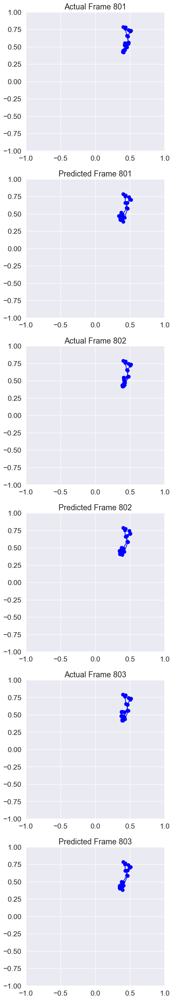

In [ ]:

# Adjusting size for better display of posture with compact canvas size
width, height = 10, 30  # Canvas size adjusted for 6 rows, 1 column

# Plot actual and predicted poses in 6 rows and 1 column
fig, axs = plt.subplots(6, 1, figsize=(width, height))

for i in range(3):  # For the 3 predicted frames
    draw_pose(axs[2 * i], actual[i], f'Actual Frame {train_size + i + 1}')      # Actual frames in odd rows
    draw_pose(axs[2 * i + 1], predictions[i], f'Predicted Frame {train_size + i + 1}')  # Predicted frames in even rows

plt.tight_layout()
plt.show()

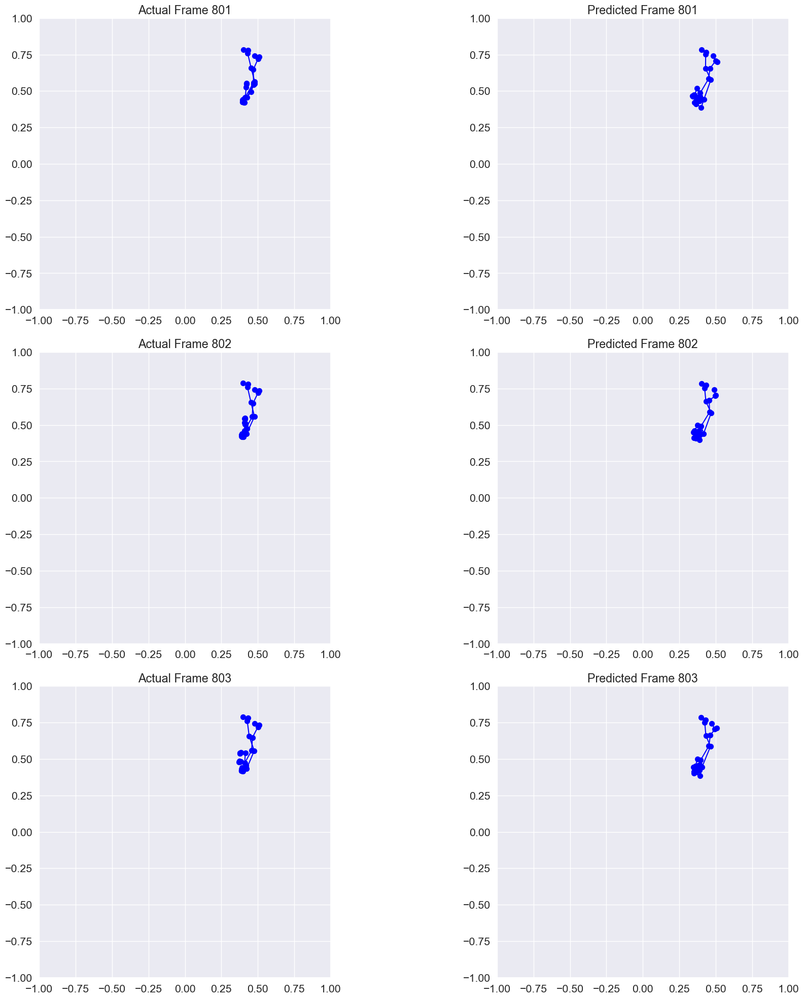

In [ ]:
# Adjusting size for larger display of posture details
width, height = 20, 20  # Larger figure size for better visibility
# Plot actual and predicted poses in 3 rows and 2 columns
fig, axs = plt.subplots(3, 2, figsize=(width, height))

for i in range(3):  # For the 3 predicted frames
    draw_pose(axs[i, 0], actual[i], f'Actual Frame {train_size + i + 1}')
    draw_pose(axs[i, 1], predictions[i], f'Predicted Frame {train_size + i + 1}')

plt.tight_layout()
plt.show()
